## Yelp Business Dataset
Objectives:
1. Identify if particular cities/states tend to higher/lower star ratings
2. Identify if star rating is related to review count
3. Identify rating trends for cafes

In [1]:
# To perform wordcloud construction, Jupyter Notebook data rate must be extended.
# jupyter notebook --NotebookApp.iopub_data_rate_limit=1.0e10

In [2]:
import pip
pip.main(['install', 'wordcloud'])

Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


0

In [15]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import json
from wordcloud import WordCloud
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split

In [16]:
#Set styling
sns.set_style('whitegrid')
sns.set(rc={"figure.figsize":(6, 4)}) #width=6, #height=4

In [17]:
data=pd.read_json("yelp_academic_dataset_business.json", lines=True, orient='columns')
df=pd.DataFrame(data)

In [18]:
orig_df = pd.DataFrame(data)

In [7]:
df.head(5)

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
0,6iYb2HFDywm3zjuRg0shjw,Oskar Blues Taproom,921 Pearl St,Boulder,CO,80302,40.017544,-105.283348,4.0,86,1,"{'RestaurantsTableService': 'True', 'WiFi': 'u...","Gastropubs, Food, Beer Gardens, Restaurants, B...","{'Monday': '11:0-23:0', 'Tuesday': '11:0-23:0'..."
1,tCbdrRPZA0oiIYSmHG3J0w,Flying Elephants at PDX,7000 NE Airport Way,Portland,OR,97218,45.588906,-122.593331,4.0,126,1,"{'RestaurantsTakeOut': 'True', 'RestaurantsAtt...","Salad, Soup, Sandwiches, Delis, Restaurants, C...","{'Monday': '5:0-18:0', 'Tuesday': '5:0-17:0', ..."
2,bvN78flM8NLprQ1a1y5dRg,The Reclaimory,4720 Hawthorne Ave,Portland,OR,97214,45.511907,-122.613693,4.5,13,1,"{'BusinessAcceptsCreditCards': 'True', 'Restau...","Antiques, Fashion, Used, Vintage & Consignment...","{'Thursday': '11:0-18:0', 'Friday': '11:0-18:0..."
3,oaepsyvc0J17qwi8cfrOWg,Great Clips,2566 Enterprise Rd,Orange City,FL,32763,28.914482,-81.295979,3.0,8,1,"{'RestaurantsPriceRange2': '1', 'BusinessAccep...","Beauty & Spas, Hair Salons",None
4,PE9uqAjdw0E4-8mjGl3wVA,Crossfit Terminus,1046 Memorial Dr SE,Atlanta,GA,30316,33.747027,-84.353424,4.0,14,1,"{'GoodForKids': 'False', 'BusinessParking': '{...","Gyms, Active Life, Interval Training Gyms, Fit...","{'Monday': '16:0-19:0', 'Tuesday': '16:0-19:0'..."


In [8]:
df.shape

(160585, 14)

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 160585 entries, 0 to 160584
Data columns (total 14 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   business_id   160585 non-null  object 
 1   name          160585 non-null  object 
 2   address       160585 non-null  object 
 3   city          160585 non-null  object 
 4   state         160585 non-null  object 
 5   postal_code   160585 non-null  object 
 6   latitude      160585 non-null  float64
 7   longitude     160585 non-null  float64
 8   stars         160585 non-null  float64
 9   review_count  160585 non-null  int64  
 10  is_open       160585 non-null  int64  
 11  attributes    145593 non-null  object 
 12  categories    160470 non-null  object 
 13  hours         133244 non-null  object 
dtypes: float64(3), int64(2), object(9)
memory usage: 17.2+ MB


In [10]:
df['name'].isnull().sum()

0

<h1>Description of Data Set</h1>

Count of businesses = 160,585

Cities represented = 836

Average star rating = 3.65

Median star rating = 4.0

Average review count = 52

Median review count = 17

In [11]:
df.describe()

,latitude,longitude,stars,review_count,is_open
count,160585.000000,160585.000000,160585.000000,160585.000000,160585.000000
mean,38.759794,-94.266212,3.656954,51.964548,0.767494
std,7.138042,19.975446,0.943604,130.030448,0.422431
min,27.998972,-123.393929,1.000000,5.000000,0.000000
25%,30.355886,-122.589583,3.000000,8.000000,1.000000
50%,42.177366,-84.383281,4.000000,17.000000,1.000000
75%,45.458531,-81.288501,4.500000,44.000000,1.000000
max,49.490000,71.113271,5.000000,9185.000000,1.000000


In [12]:
df.stars.median()

4.0

In [13]:
df.review_count.median()

17.0

In [14]:
pd.unique(df.city)

array(['Boulder', 'Portland', 'Orange City', 'Atlanta', 'Vancouver',
       'Orlando', 'Columbus', 'Austin', 'Peabody', 'Stone Mountain',
       'Kissimmee', 'Malden', 'Pine Castle', 'Boston', 'Needham',
       'Burnaby', 'Jamaica Plain', 'Clermont', 'Fern Park', 'Brookline',
       'Surrey', 'Doraville', 'Sanford', 'Burlington', 'Allston',
       'Windermere', 'Quincy', 'Chelsea', 'Somerville', 'Swampscott',
       'Newton', 'Wilmington', 'Winter Park', 'Watertown', 'Deltona',
       'Hyde Park', 'Buda', 'Cambridge', 'Reading', 'Coquitlam', 'Tucker',
       'Decatur', 'Wellesley', 'Apopka', 'Longwood', 'Titusville',
       'Reynoldsburg', 'Roslindale', 'Richmond', 'Altamonte Springs',
       'Urbancrest', 'Weymouth', 'Tigard', 'New Westminster', 'Gahanna',
       'Orange', 'Waltham', 'Happy Valley', 'Lake Mary', 'Sandy Springs',
       'Pickerington', 'Saugus', 'Brighton', 'Deland', 'Hingham',
       'Clackamas', 'Braintree', 'Danvers', 'Billerica', 'Oviedo',
       'Louisville', 'Mel

In [15]:
#836 unique cities are represented
len(pd.unique(df.city))

836

### Data Cleaning

In [19]:
df=df.drop(columns=['business_id','is_open','latitude','longitude','postal_code','hours'])
df.head()

,name,address,city,state,stars,review_count,attributes,categories
0,Oskar Blues Taproom,921 Pearl St,Boulder,CO,4.0,86,"{'RestaurantsTableService': 'True', 'WiFi': 'u...","Gastropubs, Food, Beer Gardens, Restaurants, B..."
1,Flying Elephants at PDX,7000 NE Airport Way,Portland,OR,4.0,126,"{'RestaurantsTakeOut': 'True', 'RestaurantsAtt...","Salad, Soup, Sandwiches, Delis, Restaurants, C..."
2,The Reclaimory,4720 Hawthorne Ave,Portland,OR,4.5,13,"{'BusinessAcceptsCreditCards': 'True', 'Restau...","Antiques, Fashion, Used, Vintage & Consignment..."
3,Great Clips,2566 Enterprise Rd,Orange City,FL,3.0,8,"{'RestaurantsPriceRange2': '1', 'BusinessAccep...","Beauty & Spas, Hair Salons"
4,Crossfit Terminus,1046 Memorial Dr SE,Atlanta,GA,4.0,14,"{'GoodForKids': 'False', 'BusinessParking': '{...","Gyms, Active Life, Interval Training Gyms, Fit..."


In [20]:
cats=df.categories.str.split(pat = ",", expand=True)
frames=[df,cats]
df=pd.concat(frames, axis=1, join="outer")
# df.head(10)

,name,address,city,state,stars,review_count,attributes,categories,0,1,...,27,28,29,30,31,32,33,34,35,36
0,Oskar Blues Taproom,921 Pearl St,Boulder,CO,4.0,86,"{'RestaurantsTableService': 'True', 'WiFi': 'u...","Gastropubs, Food, Beer Gardens, Restaurants, B...",Gastropubs,Food,...,None,None,None,None,None,None,None,None,None,None
1,Flying Elephants at PDX,7000 NE Airport Way,Portland,OR,4.0,126,"{'RestaurantsTakeOut': 'True', 'RestaurantsAtt...","Salad, Soup, Sandwiches, Delis, Restaurants, C...",Salad,Soup,...,None,None,None,None,None,None,None,None,None,None
2,The Reclaimory,4720 Hawthorne Ave,Portland,OR,4.5,13,"{'BusinessAcceptsCreditCards': 'True', 'Restau...","Antiques, Fashion, Used, Vintage & Consignment...",Antiques,Fashion,...,None,None,None,None,None,None,None,None,None,None
3,Great Clips,2566 Enterprise Rd,Orange City,FL,3.0,8,"{'RestaurantsPriceRange2': '1', 'BusinessAccep...","Beauty & Spas, Hair Salons",Beauty & Spas,Hair Salons,...,None,None,None,None,None,None,None,None,None,None
4,Crossfit Terminus,1046 Memorial Dr SE,Atlanta,GA,4.0,14,"{'GoodForKids': 'False', 'BusinessParking': '{...","Gyms, Active Life, Interval Training Gyms, Fit...",Gyms,Active Life,...,None,None,None,None,None,None,None,None,None,None
5,Bob Likes Thai Food,3755 Main St,Vancouver,BC,3.5,169,"{'GoodForKids': 'True', 'Alcohol': 'u'none'', ...","Restaurants, Thai",Restaurants,Thai,...,None,None,None,None,None,None,None,None,None,None
6,Escott Orthodontics,2511 Edgewater Dr,Orlando,FL,4.5,7,"{'AcceptsInsurance': 'True', 'BusinessAcceptsC...","Dentists, Health & Medical, Orthodontists",Dentists,Health & Medical,...,None,None,None,None,None,None,None,None,None,None
7,Boxwood Biscuit,740 S High St,Columbus,OH,4.5,11,None,"Breakfast & Brunch, Restaurants",Breakfast & Brunch,Restaurants,...,None,None,None,None,None,None,None,None,None,None
8,Lane Wells Jewelry Repair,"7801 N Lamar Blvd, Ste A140",Austin,TX,5.0,30,"{'RestaurantsPriceRange2': '1', 'ByAppointment...","Shopping, Jewelry Repair, Appraisal Services, ...",Shopping,Jewelry Repair,...,None,None,None,None,None,None,None,None,None,None
9,Capital City Barber Shop,"615 W Slaughter Ln, Ste 113",Austin,TX,4.0,5,"{'BusinessAcceptsCreditCards': 'False', 'Resta...","Barbers, Beauty & Spas",Barbers,Beauty & Spas,...,None,None,None,None,None,None,None,None,None,None


In [21]:
cafes = df[df.eq("Cafes").any(1)]
coffee = df[df.eq("Coffee & Tea").any(1)]
coffee_frames = [cafes,coffee]
all_cafes = pd.concat(coffee_frames, axis=0, join="outer")
# all_cafes

In [18]:
df[df['stars'] == 5]

,name,address,city,state,stars,review_count,attributes,categories,0,1,...,27,28,29,30,31,32,33,34,35,36
8,Lane Wells Jewelry Repair,"7801 N Lamar Blvd, Ste A140",Austin,TX,5.0,30,"{'RestaurantsPriceRange2': '1', 'ByAppointment...","Shopping, Jewelry Repair, Appraisal Services, ...",Shopping,Jewelry Repair,...,None,None,None,None,None,None,None,None,None,None
37,McKinley Chiropractic,"5625 Eiger Rd, Ste 160",Austin,TX,5.0,5,"{'BusinessAcceptsCreditCards': 'True', 'Accept...","Chiropractors, Health & Medical",Chiropractors,Health & Medical,...,None,None,None,None,None,None,None,None,None,None
38,El Pollo Rey,1725 E Riverside Dr,Austin,TX,5.0,11,"{'RestaurantsGoodForGroups': 'True', 'Restaura...","Food Trucks, Restaurants, Specialty Food, Food...",Food Trucks,Restaurants,...,None,None,None,None,None,None,None,None,None,None
60,Texas Global Passport Services,"2400 Nueces St, Ste B (Fl 2)",Austin,TX,5.0,112,None,"Colleges & Universities, Education, Hotels & T...",Colleges & Universities,Education,...,None,None,None,None,None,None,None,None,None,None
66,Feitoza Service,,Chelsea,MA,5.0,15,"{'BusinessAcceptsCreditCards': 'False', 'Busin...","Wallpapering, Home Services",Wallpapering,Home Services,...,None,None,None,None,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
160559,Medallion Energy,151 Baywood Ave,Longwood,FL,5.0,6,"{'BusinessAcceptsCreditCards': 'True', 'ByAppo...","Home Services, Swimming Pools, Hot Tub & Pool,...",Home Services,Swimming Pools,...,None,None,None,None,None,None,None,None,None,None
160563,Ciao! Pizza & Pasta,59 Williams St,Chelsea,MA,5.0,733,"{'GoodForKids': 'True', 'RestaurantsPriceRange...","Restaurants, Pizza, Italian",Restaurants,Pizza,...,None,None,None,None,None,None,None,None,None,None
160567,Austin Stained Concrete and More,5710 Fitchwood Ln,Austin,TX,5.0,19,{'BusinessAcceptsCreditCards': 'True'},"Masonry/Concrete, Home Services, Flooring",Masonry/Concrete,Home Services,...,None,None,None,None,None,None,None,None,None,None
160571,Blue Label Granite,"1481 Robert S Light Blvd, Bldg B",Buda,TX,5.0,45,"{'BusinessParking': '{'garage': False, 'street...","Shopping, Tiling, Building Supplies, Counterto...",Shopping,Tiling,...,None,None,None,None,None,None,None,None,None,None


In [19]:
orig_df.corr()

,latitude,longitude,stars,review_count,is_open
latitude,1.000000,-0.462023,0.000250,-0.030456,-0.035223
longitude,-0.462023,1.000000,-0.066274,0.022665,0.028271
stars,0.000250,-0.066274,1.000000,0.034220,0.073742
review_count,-0.030456,0.022665,0.034220,1.000000,0.037369
is_open,-0.035223,0.028271,0.073742,0.037369,1.000000


In [20]:
df.corr()

,stars,review_count
stars,1.00000,0.03422
review_count,0.03422,1.00000


<h1>Plots and Visualizations</h1>

## Which states are most represented in our data set?

In [22]:
sns.set_palette("bright")

Text(0.5, 1.0, 'States Represented')

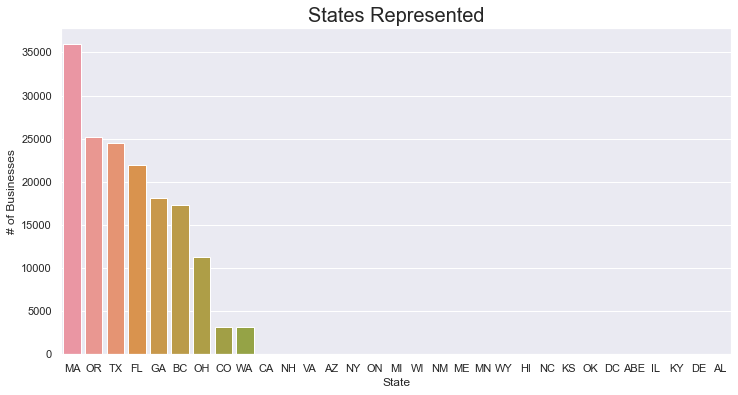

In [23]:
state_count = df.state.value_counts()

plt.figure(figsize=(12,6))
sns.barplot(x=state_count.index, y=state_count.values)
plt.xlabel('State')
plt.ylabel('# of Businesses')
plt.title('States Represented', size=20)

## Which city has the most businesses in our data set?

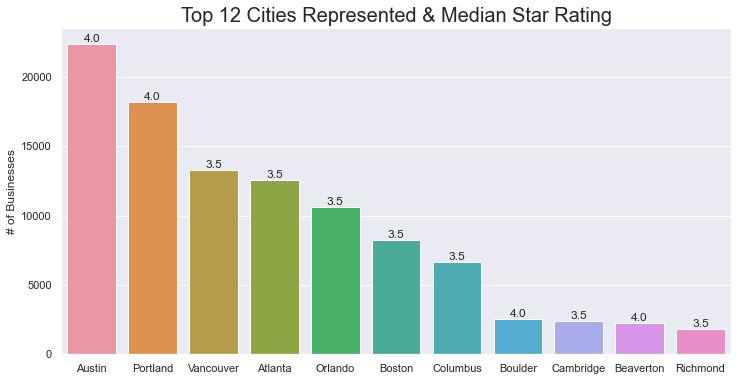

In [23]:
city_count = df.city.value_counts()
top_city_count = city_count[0:11]
grouped = df.groupby('city')
grouped_median = grouped['stars'].agg(np.median)
grouped_median
grouped_median = grouped_median[(grouped_median.index == 'Austin')
                            | (grouped_median.index == 'Portland')
                            | (grouped_median.index == 'Vancouver')
                            | (grouped_median.index == 'Vancouver')
                            | (grouped_median.index == 'Atlanta')
                            | (grouped_median.index == 'Orlando')
                            | (grouped_median.index == 'Boston')
                            | (grouped_median.index == 'Columbus')
                            | (grouped_median.index == 'Boulder')
                            | (grouped_median.index == 'Cambridge')
                            | (grouped_median.index == 'Beaverton') 
                            | (grouped_median.index == 'Richmond')
                           ]
city_median = pd.concat([top_city_count, grouped_median], axis=1)

plt.figure(figsize=(12,6))
ax = sns.barplot(data=city_median, x=city_median.index, y=city_median.city)
plt.xlabel('')
plt.ylabel('# of Businesses')
plt.title('Top 12 Cities Represented & Median Star Rating', size=20)

rects = ax.patches
labels = city_median.stars
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')

plt.show()

Text(0.5, 1.0, 'Star Ratings and Volume of Businesses in Top Cities')

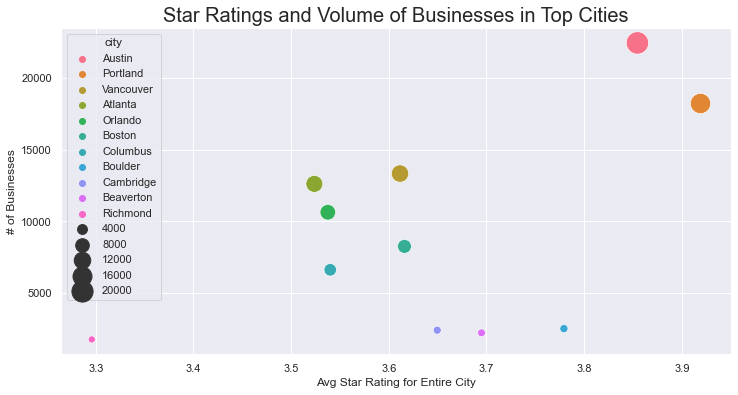

In [110]:
city_count = df.city.value_counts()
top_city_count = city_count[0:11]
grouped = df.groupby('city')
grouped_mean = grouped['stars'].agg(np.mean)
grouped_mean
grouped_mean = grouped_mean[(grouped_mean.index == 'Austin')
                            | (grouped_mean.index == 'Portland')
                            | (grouped_mean.index == 'Vancouver')
                            | (grouped_mean.index == 'Vancouver')
                            | (grouped_mean.index == 'Atlanta')
                            | (grouped_mean.index == 'Orlando')
                            | (grouped_mean.index == 'Boston')
                            | (grouped_mean.index == 'Columbus')
                            | (grouped_mean.index == 'Boulder')
                            | (grouped_mean.index == 'Cambridge')
                            | (grouped_mean.index == 'Beaverton') 
                            | (grouped_mean.index == 'Richmond')
                           ]
city_mean = pd.concat([top_city_count, grouped_mean], axis=1)

plt.figure(figsize=(12,6))
sns.scatterplot(data=city_mean, 
                x=city_mean.stars, 
                y=city_mean.city, 
                hue=city_mean.index,
                size=city_mean.city,
                sizes=(50,500))
plt.ylabel("# of Businesses")
plt.xlabel("Avg Star Rating for Entire City")
plt.title("Star Ratings and Volume of Businesses in Top Cities", fontsize=20)

## What city has the highest rated businesses?

In [25]:
grouped_city = df.groupby('city')
grouped_city_mean = grouped_city['stars'].agg(np.mean)
print(max(grouped_city_mean.index), max(grouped_city_mean))
print(grouped_city_mean.sort_values(ascending=False))

watertown 5.0
city
watertown      5.0
Vancovuer      5.0
Charleston     5.0
Stoughon       5.0
Stouhgton      5.0
              ... 
Winder         1.0
Buford         1.0
Vanvouver      1.0
WInter Park    1.0
Miami Beach    1.0
Name: stars, Length: 836, dtype: float64


## Do businesses' star ratings follow a normal distribution?

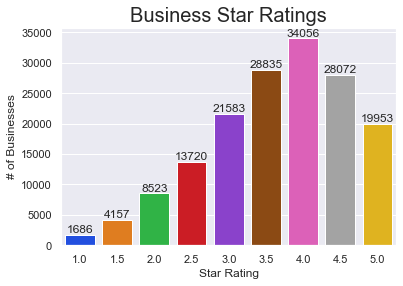

In [45]:
star_count = df.stars.value_counts()
star_count = star_count.sort_values()

ax = sns.barplot(x=star_count.index, y=star_count.values)
plt.xlabel('Star Rating')
plt.ylabel('# of Businesses')
plt.title('Business Star Ratings', size=20)

rects = ax.patches
labels = [1686,4157,8523,13720,21583,28835,34056,28072,19953]
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')

plt.show()

## How many reviews do 4 and 5 star businesses get?

Text(0.5, 1.0, "Number of Reviews by Business's Star Rating")

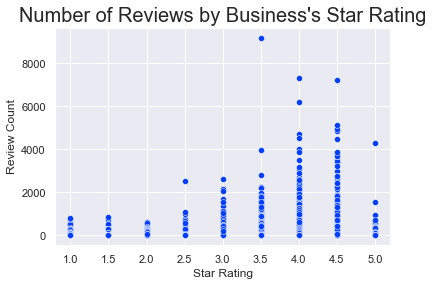

In [27]:
sns.scatterplot(data=df, x="stars", y="review_count")
plt.xlabel("Star Rating")
plt.ylabel('Review Count')
plt.title("Number of Reviews by Business's Star Rating", size=20)

/Users/tomphoenixsnyder/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


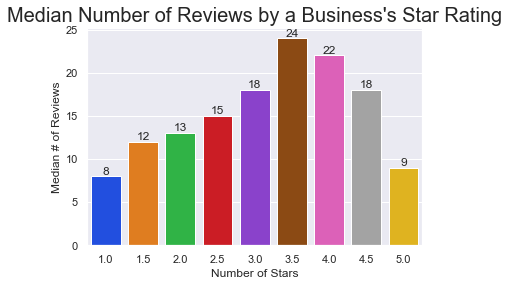

In [28]:
grouped = df.groupby('stars')
grouped_median = grouped['review_count'].agg(np.median)

ax = sns.barplot(grouped_median.index, grouped_median.values)
plt.xlabel("Number of Stars")
plt.ylabel("Median # of Reviews")
plt.title("Median Number of Reviews by a Business's Star Rating", fontsize=20)

rects = ax.patches
labels = grouped_median.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom')

plt.show()

 ## Which state submits the most reviews?


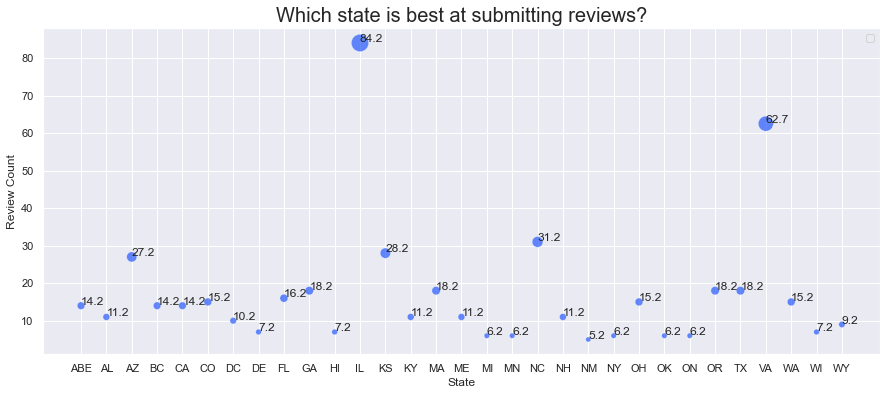

In [78]:
grouped = df.groupby('state')
grouped_median = grouped['review_count'].agg(np.median)
states = grouped_median.index

plt.figure(figsize=(15,6))
ax = sns.scatterplot(data=grouped_median,
                     x=grouped_median.index,
                     y=grouped_median.values,
                     size=grouped_median.values,
                     sizes=(25,300),
                     alpha=.6)
plt.xlabel("State")
plt.ylabel('Review Count')
plt.title("Which state is best at submitting reviews?", fontsize=20)
plt.legend('')

for i, st in enumerate (states):
    plt.text(st,
             grouped_median[i]+0.2, 
             grouped_median.values[i]+0.2)
    
plt.show()

## What categories are most common?

In [40]:
merged = df.iloc[:,8].values.tolist()

for i in range(9,37):
    list = df.iloc[:,i].values.tolist()
    for item in list:
        if item != None:
            merged.append(item)
    
# merged.remove(None)
print(len(pd.unique(merged)))
#print(merged)

2488
['Gastropubs', 'Salad', 'Antiques', 'Beauty & Spas', 'Gyms', 'Restaurants', 'Dentists', 'Breakfast & Brunch', 'Shopping', 'Barbers', 'Food', 'Wigs', 'Food', 'Restaurants', 'Books', 'Oil Change Stations', 'Restaurants', 'Hotels', 'Specialty Schools', 'Automotive', 'Nail Salons', 'Auto Repair', 'Hotels', 'Tours', 'Hotels', 'Shopping', 'Restaurants', 'Home Services', 'Nightlife', 'Sandwiches', 'Health & Medical', 'Education', 'Acupuncture', 'Food Delivery Services', 'Playgrounds', 'Creperies', 'Nightlife', 'Chiropractors', 'Food Trucks', 'Diagnostic Services', 'Local Services', 'Bars', 'Steakhouses', 'Local Services', 'Convenience Stores', 'Oil Change Stations', 'Pet Services', 'Indian', 'Home & Garden', 'Train Stations', 'Vegetarian', 'Italian', 'Restaurants', 'Restaurants', 'Restaurants', 'Home Services', 'Adult Education', 'Food', 'Insurance', 'Junk Removal & Hauling', 'Colleges & Universities', 'Fast Food', 'Food', 'Pizza', 'Flooring', 'Coffee & Tea', 'Wallpapering', 'Custom Cake

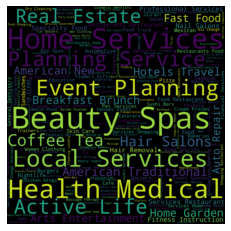

In [76]:
# merged.remove(None)
# merged.remove(None)
# merged.remove(None)
# merged.remove(None)
# merged.remove(None)
# merged.remove(None)
# merged.remove(None)
# merged.remove(None)
# merged.remove(None)
# merged.remove(None)
# merged.remove(None)
# merged.remove(None)
# merged.remove(None)
# merged.remove(None)

new_list = " ".join(merged)
# print(new_list)
wordcloud = WordCloud(width=1200, height=1200, margin=0).generate(new_list)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.margins(x=0, y=0)
plt.show()

Text(0.5, 1.0, 'Correlation')

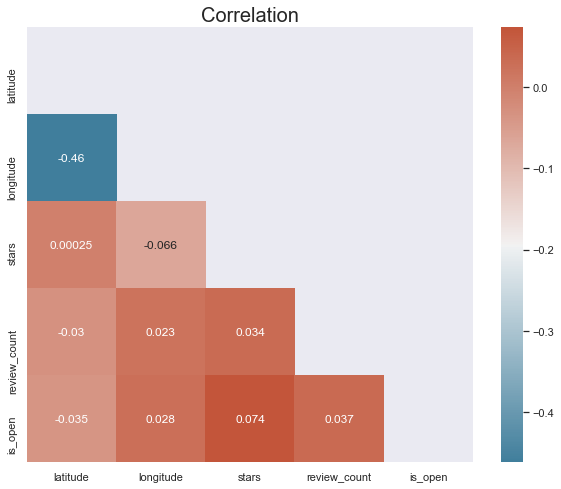

In [31]:
orig_corr=orig_df.corr()
f, ax = plt.subplots(figsize=(10, 8))
mask = np.triu(np.ones_like(orig_corr, dtype=bool))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(orig_corr, annot=True, mask = mask, cmap=cmap)
plt.title("Correlation", fontsize=20)

# Cafe Analysis

In [99]:
all_cafes.head()

,name,address,city,state,stars,review_count,attributes,categories,0,1,...,27,28,29,30,31,32,33,34,35,36
582,Biscuits Cafe,"4200 Mercantile Dr, Ste 790",Lake Oswego,OR,3.5,128,"{'HasTV': 'False', 'RestaurantsReservations': ...","Cafes, American (Traditional), Restaurants, Br...",Cafes,American (Traditional),...,None,None,None,None,None,None,None,None,None,None
630,Ole Cafe,"1800 SW 1st Ave, Ste 130",Portland,OR,3.0,10,"{'RestaurantsGoodForGroups': 'False', 'Restaur...","Cafes, Restaurants, Delis, Sandwiches",Cafes,Restaurants,...,None,None,None,None,None,None,None,None,None,None
637,Caffè Nero,339 Washington St,Wellesley,MA,4.0,57,"{'Caters': 'False', 'BusinessAcceptsCreditCard...","Cafes, Coffee & Tea, Restaurants, Food",Cafes,Coffee & Tea,...,None,None,None,None,None,None,None,None,None,None
788,f&b cafe and catering,2701 NW Vaughn St,Portland,OR,2.5,11,"{'RestaurantsReservations': 'False', 'Restaura...","Cafes, American (Traditional), Restaurants",Cafes,American (Traditional),...,None,None,None,None,None,None,None,None,None,None
899,SquareRüt Kava Bar,5000 N Lamar Blvd,Austin,TX,4.0,34,"{'NoiseLevel': 'u'quiet'', 'Music': '{'dj': Fa...","Cafes, Restaurants, Lounges, Nightlife, Food, ...",Cafes,Restaurants,...,None,None,None,None,None,None,None,None,None,None


Text(0, 0.5, 'Avg Star Rating')

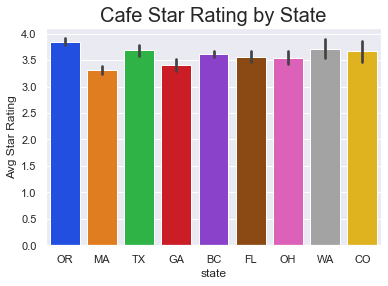

In [130]:
sns.barplot(data=all_cafes, x='state', y='stars')
plt.title('Cafe Star Rating by State', fontsize=20)
plt.ylabel('Avg Star Rating')

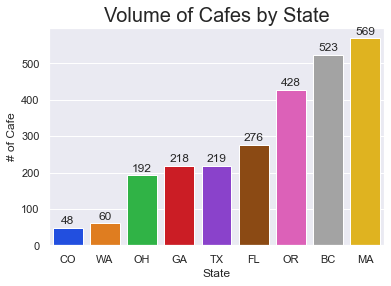

In [134]:
state_count = all_cafes.state.value_counts()
state_count = state_count.sort_values()

ax = sns.barplot(x=state_count.index, y=state_count.values)
plt.xlabel('State')
plt.ylabel('# of Cafe')
plt.title('Volume of Cafes by State', size=20)

rects = ax.patches
labels = state_count.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')

plt.show()